# FFTを用いた偏微分方程式の数値解法(in-place版)

黒木玄

2018-01-23～2019-04-16

* Copyrigtht 2018, 2019 Gen Kuroki
* License: MIT https://opensource.org/licenses/MIT

$
\newcommand\Z{{\mathbb Z}}
\newcommand\R{{\mathbb R}}
\newcommand\C{{\mathbb C}}
\newcommand\eps{\varepsilon}
\newcommand\QED{\text{□}}
\newcommand\d{\partial}
\newcommand\sech{\operatorname{sech}}
$

このノートブックは最初以下の2つのノートブックの続きとして作成された.

* [FFTを用いた熱方程式やKdV方程式などを数値解法](http://nbviewer.jupyter.org/gist/genkuroki/14b05a2cfa172fc5ea351641d4bdda11)
* [2次元配列でのFFTの使い方](http://nbviewer.jupyter.org/gist/genkuroki/26928d4a1ae2e912a3850ed1b31e2941)

このノートブックでは in-place でFFTを使うことによってメモリ効率を最適化することを行いたい. 

例として空間が1次元の熱方程式, KdV方程式, Schrödinger方程式, Smith方程式を扱う.

<h1>目次<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#諸定義" data-toc-modified-id="諸定義-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>諸定義</a></span><ul class="toc-item"><li><span><a href="#パッケージの読み込み" data-toc-modified-id="パッケージの読み込み-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>パッケージの読み込み</a></span></li><li><span><a href="#数式を使った解説" data-toc-modified-id="数式を使った解説-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>数式を使った解説</a></span></li><li><span><a href="#FFT_Data-タイプの定義" data-toc-modified-id="FFT_Data-タイプの定義-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>FFT_Data タイプの定義</a></span></li><li><span><a href="#プロット用の函数" data-toc-modified-id="プロット用の函数-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>プロット用の函数</a></span></li></ul></li><li><span><a href="#熱方程式で以上の定義のテスト" data-toc-modified-id="熱方程式で以上の定義のテスト-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>熱方程式で以上の定義のテスト</a></span></li><li><span><a href="#KdV方程式の数値解法の最適化" data-toc-modified-id="KdV方程式の数値解法の最適化-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>KdV方程式の数値解法の最適化</a></span><ul class="toc-item"><li><span><a href="#プロット用函数" data-toc-modified-id="プロット用函数-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>プロット用函数</a></span></li><li><span><a href="#FFTを-FFT-*-v,-FFT-\-v-の形式で利用した場合" data-toc-modified-id="FFTを-FFT-*-v,-FFT-\-v-の形式で利用した場合-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>FFTを <code>FFT * v</code>, <code>FFT \ v</code> の形式で利用した場合</a></span></li><li><span><a href="#FFTを-in-place-で利用した場合" data-toc-modified-id="FFTを-in-place-で利用した場合-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>FFTを in-place で利用した場合</a></span></li><li><span><a href="#KdV方程式:-初期条件-sin" data-toc-modified-id="KdV方程式:-初期条件-sin-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>KdV方程式: 初期条件 sin</a></span></li><li><span><a href="#ベンチマークテスト" data-toc-modified-id="ベンチマークテスト-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>ベンチマークテスト</a></span></li><li><span><a href="#KdV方程式:-2-soliton解" data-toc-modified-id="KdV方程式:-2-soliton解-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>KdV方程式: 2-soliton解</a></span></li></ul></li><li><span><a href="#空間1次元の時間依存のSchrödinger方程式" data-toc-modified-id="空間1次元の時間依存のSchrödinger方程式-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>空間1次元の時間依存のSchrödinger方程式</a></span><ul class="toc-item"><li><span><a href="#Gaussian-packet" data-toc-modified-id="Gaussian-packet-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Gaussian packet</a></span></li><li><span><a href="#自由粒子" data-toc-modified-id="自由粒子-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>自由粒子</a></span></li><li><span><a href="#低い壁" data-toc-modified-id="低い壁-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>低い壁</a></span></li><li><span><a href="#高い壁" data-toc-modified-id="高い壁-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>高い壁</a></span></li><li><span><a href="#調和振動子" data-toc-modified-id="調和振動子-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>調和振動子</a></span></li><li><span><a href="#$V(x)-=--100-\exp(-x^2/100)$" data-toc-modified-id="$V(x)-=--100-\exp(-x^2/100)$-4.6"><span class="toc-item-num">4.6&nbsp;&nbsp;</span>$V(x) = -100 \exp(-x^2/100)$</a></span></li></ul></li><li><span><a href="#Smith方程式" data-toc-modified-id="Smith方程式-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Smith方程式</a></span><ul class="toc-item"><li><span><a href="#Smith方程式:-初期条件-sin" data-toc-modified-id="Smith方程式:-初期条件-sin-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Smith方程式: 初期条件 sin</a></span></li><li><span><a href="#Smith方程式:-初期条件-KdV-2-soliton" data-toc-modified-id="Smith方程式:-初期条件-KdV-2-soliton-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Smith方程式: 初期条件 KdV 2-soliton</a></span></li></ul></li></ul></div>

## 諸定義

### パッケージの読み込み

In [1]:
using Base64
using FFTW
using LinearAlgebra
const e = ℯ

using PyPlot

default_figsize = (6.4, 4.8)  # このデフォルトサイズは大き過ぎるので
rc("figure", figsize=(3,2.4)) # このように小さくしておく.

using PyCall
const animation = pyimport("matplotlib.animation")

function displayfile(mimetype, file)
    open(file) do f
        base64text = base64encode(f)
        display("text/html", """<img src="data:$mimetype;base64,$base64text">""")
    end
end

displayfile (generic function with 1 method)

In [2]:
@show Sys.CPU_THREADS
FFTW.set_num_threads(Sys.CPU_THREADS)

Sys.CPU_THREADS = 8


### 数式を使った解説

周期 $L=2\pi K$ を持つ函数を

$$
f(x) = 
\sum_{k=-N/2+1}^{N/2} (-1)^{k-1} a_k\;e^{2\pi i(k-1)x/L} =
\sum_{k=-N/2+1}^{N/2} (-1)^{k-1} a_k\;e^{i(k-1)x/K}
$$

の形の有限Fourier級数でよく近似できていると仮定する. これの導函数は

$$
f'(x) = \sum_{k=-N/2+1}^{N/2} (-1)^{k-1} \frac{i(k-1)}{K}a_k\;e^{i(k-1)x/K}
$$

になる. すなわち, $f(x)$ を微分する操作は,  $-N/2< k \leqq N/2$ のとき $a_k$ に $i(k-1)/K$ をかける操作に対応している. $-N/2< k \leqq N/2$ のとき $a_k$ に $i(k-1)/K$ をかける操作は(丸め誤差)を除いて, 有限Fourier級数の正確な微分を与えることに注意せよ. この計算方法は小さな $h$ について $(f(x+h/2)-f(x-h/2))/h$ のような方法で微分を求める方法よりも誤差が小さい.

さらに $x$ を

$$
\Delta x = \frac{L}{N} = \frac{2\pi K}{N}, \quad
x_j = (j-1)\Delta x -\frac{L}{2} = L\left(\frac{j-1}{N} - \frac{1}{2}\right)
$$

で離散化したとする. このとき,

$$
f(x_j) = \sum_{k=-N/2+1}^{N/2} a_k\,e^{i(k-1)(j-1)/N}.
$$

これは, $a_{k+N}=a_k$ という仮定のもとで

$$
a_{k+N} \,e^{i((k+N)-1)(j-1)/N} = a_k e^{i(k-1)(j-1)/N}
$$

であり, $k=-N/2+1,-N/2+2,\ldots,0$ が $k+N=N/2+1,N/2+2,\ldots,N$ に対応するので, 

$$
f(x_j) = \sum_{k=1}^N a_k\,e^{i(k-1)(j-1)/N}
$$

と書き直される.  これはJulia言語の離散Fourier変換のスタイルに一致している. 

この表示のもとで, $f(x)$ を微分する操作は, $1\leqq k\leqq N/2$ のとき $i(k-1)/N$ を $a_k$ にかけ, $N/2+1\leqq k\leqq N$ のとき $i(k-1-N)/N$ を $a_k$ にかける操作に対応している.  下の方で定義される `FFT_Data` における `D` を成分ごとにかける操作はまさにこの操作になっている.

In [3]:
?ifft

search: ifft ifft! ifftshift irfft plan_ifft plan_ifft! Cptrdiff_t plan_irfft



```
ifft(A [, dims])
```

Multidimensional inverse FFT.

A one-dimensional inverse FFT computes

$$
\operatorname{IDFT}(A)[k] = \frac{1}{\operatorname{length}(A)}
\sum_{n=1}^{\operatorname{length}(A)} \exp\left(+i\frac{2\pi (n-1)(k-1)}
{\operatorname{length}(A)} \right) A[n].
$$

A multidimensional inverse FFT simply performs this operation along each transformed dimension of `A`.


### FFT_Data タイプの定義

`roi(a, b, N)` (right-open interval $[a,b)$) は閉区間 $[a,b]$ を $N$ 等分して両端の点も合わせて $N+1$ 個の点を得た後に右端の点を除いたものになる.  右半開区間 $[a,b)$ の $N$ 等分だと思ってよい.

`x_axis(L, N)` は $[-L/2, L/2)$ の $N$ 等分になり, $x$ 軸の離散化とみなされる.

`k_axis(N)` は波数空間(波数軸)の離散化を意味する. 上の数式を使った解説より, $k_axis(N)$ は右半開区間 $[0, N/2)$ と $[-N/2,0)$ の離散化をその順序で連結したものにしなければいけない.

`o = FFT_Data(K, N)` 型のとき, `o` は $K=2\pi K$ のときの周期境界条件が課された $[-L/2, L/2)$ の $N$ 等分を $x$ 軸の離散化とみなしたときの, 高速Fourier変換関係のデータになる.

* `o.K` は $K$ になる. 
* `o.L` は $x$ 軸方向の周期の長さ $2\pi K$ になる.
* `o.N` は $N$ になる. $[-L/2, L/2)$ が $N$ 等分される.
* `o.x` は `x_axis(L, N)` になる.
* `o.k` は `k_axis(N)` になる.
* `o.D` は `im .* k ./ K` すなわちそれを成分ごとにかける操作は波数空間で実現された $\d/\d x$ になる.
* `o.D2` を成分ごとにかける操作は波数空間で実現された $(\d/\d x)^2$ になる.
* `o.D3` を成分ごとにかける操作は波数空間で実現された $(\d/\d x)^3$ になる.
* `o.D4` を成分ごとにかける操作は波数空間で実現された $(\d/\d x)^4$ になる.
* `o.FFT` は以上の設定における高速Fourier変換の「プラン」になる.

In [4]:
# right-open interval [a,b)
#
roi(a, b, N) = collect(range(a, b-(b-a)/N, length=N))

# x axis (Assume the priodic boundary condition with period L)
#
x_axis(L, N) = roi(-L/2, L/2, N)

# k axis (k = the wave number)
#
function k_axis(N)
    @assert iseven(N)
    Ndiv2 = div(N,2)
    vcat(roi(0,Ndiv2,Ndiv2), roi(-Ndiv2,0,Ndiv2))
end

# FFT Data
#
mutable struct FFT_Data{T<:Real, S}
    K::T
    L::T
    N::Int64
    x::Array{T,1}
    k::Array{T,1}
    D::Array{Complex{T},1}
    D2::Array{Complex{T},1}
    D3::Array{Complex{T},1}
    D4::Array{Complex{T},1}
    FFT::S
end

# FFT \ (D.^m .* (FFT * u)) = (d/dx)^m u
#
function FFT_Data(K, N)
    L = 2π*K
    x = x_axis(L, N)
    k = k_axis(N)
    D = im .* k ./ K
    FFT  = plan_fft(Array{Complex{Float64},1}(undef, N))
    FFT_Data(Float64(K), L, N, x, k, D, D.^2, D.^3, D.^4, FFT)
end

FFT_Data

Julia言語におけるFFTの使い方については以下を参照せよ.

In [5]:
?plan_fft

search: plan_fft plan_fft! plan_rfft plan_ifft plan_bfft plan_ifft! plan_bfft!



```
plan_fft(A [, dims]; flags=FFTW.ESTIMATE, timelimit=Inf)
```

Pre-plan an optimized FFT along given dimensions (`dims`) of arrays matching the shape and type of `A`.  (The first two arguments have the same meaning as for [`fft`](@ref).) Returns an object `P` which represents the linear operator computed by the FFT, and which contains all of the information needed to compute `fft(A, dims)` quickly.

To apply `P` to an array `A`, use `P * A`; in general, the syntax for applying plans is much like that of matrices.  (A plan can only be applied to arrays of the same size as the `A` for which the plan was created.)  You can also apply a plan with a preallocated output array `Â` by calling `mul!(Â, plan, A)`.  (For `mul!`, however, the input array `A` must be a complex floating-point array like the output `Â`.) You can compute the inverse-transform plan by `inv(P)` and apply the inverse plan with `P \ Â` (the inverse plan is cached and reused for subsequent calls to `inv` or `\`), and apply the inverse plan to a pre-allocated output array `A` with `ldiv!(A, P, Â)`.

The `flags` argument is a bitwise-or of FFTW planner flags, defaulting to `FFTW.ESTIMATE`. e.g. passing `FFTW.MEASURE` or `FFTW.PATIENT` will instead spend several seconds (or more) benchmarking different possible FFT algorithms and picking the fastest one; see the FFTW manual for more information on planner flags.  The optional `timelimit` argument specifies a rough upper bound on the allowed planning time, in seconds. Passing `FFTW.MEASURE` or `FFTW.PATIENT` may cause the input array `A` to be overwritten with zeros during plan creation.

[`plan_fft!`](@ref) is the same as [`plan_fft`](@ref) but creates a plan that operates in-place on its argument (which must be an array of complex floating-point numbers). [`plan_ifft`](@ref) and so on are similar but produce plans that perform the equivalent of the inverse transforms [`ifft`](@ref) and so on.


### プロット用の函数

虚部が至る所ほぼ $0$ なら虚部をプロットしない.

In [6]:
# nearly zero
#
function imagisnealyzero(z)
    maximum(abs, imag(z))/(maximum(abs, real(z)) + 1e-15) < 1e-3
end

# plot complex number array u on x
#
function plot_u(x, u)
    plot(x, real(u), label="Re", lw=0.8)
    imagisnealyzero(u) || plot(x, imag(u), label="Im", lw=0.8, ls="--")
    grid(ls=":")
    xticks(fontsize=8)
    yticks(fontsize=8)
end

plot_u (generic function with 1 method)

## 熱方程式で以上の定義のテスト

この節では次の熱方程式を $x$ 方向に関する周期境界条件のもとで数値的に解こう:

$$
u_t = u_{xx}.
$$

この方程式は形式的には次のように解ける: $u(t) : x\mapsto u(t,x)$ について, 

$$
u(t) = \exp\left(t \left(\frac{\d}{\d x}\right)^2\right)u(0).
$$

以下では $x$ 方向について離散化し, $(\d/\d x)^2$ を高速Fourier変換(FFT)を使って実現する.

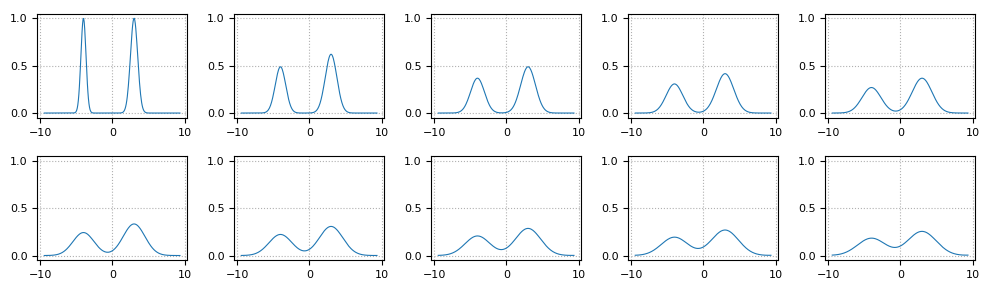

  0.638447 seconds (1.92 M allocations: 98.374 MiB, 5.06% gc time)


In [7]:
# Application - the solution of the heat equation u_t = u_{xx}
#
#     u(t) = exp(t (∂/∂x)^2) u(0)
#
sol_of_heat_eq(o::FFT_Data, u0, t) = o.FFT \ (exp.(t .* o.D2) .* (o.FFT * u0))

N = 2^8
K = 3
o = FFT_Data(K, N);

f0(x) = exp(-4(x+4)^2) + exp(-2(x-3)^2)
u0 = f0.(o.x)
t = roi(0,2,10)
@time u = [sol_of_heat_eq(o, u0, t) for t in t]

figure(figsize=(10, 3))
for j in 1:10
    subplot(2,5,j)
    plot_u(o.x, u[j])
    ylim(-0.05,1.05)
end
tight_layout()

## KdV方程式の数値解法の最適化

この節では次の形でのKdV方程式を $x$ 方向に関する周期境界条件のもとで数値的に解こう:

$$
u_t = -u_{xxx}-3(u^2)_x = -u_{xxx} -6uu_x.
$$

この方程式に従う時間発展は $\varDelta t$ が微小なとき次のように近似的に書き直される:

$$
\begin{aligned}
u(t,x) &\mapsto
\tilde{u}(t,x) = 
\exp\left(-\varDelta t \left(\frac{\d}{\d x}\right)^3\right)u(t)
\\ &\mapsto
u(t+\varDelta t,x) = \tilde{u}(t,x) - 3\varDelta t\frac{\d}{\d x}(\tilde{u}(t,x)^2).
\end{aligned}
$$

以下では $x$ 方向について離散化し, $(\d/\d x)^3$ や $\d/\d x$ を高速Fourier変換(FFT)を使って実現する.

### プロット用函数

In [8]:
function plot_u(o, u, nrows, j, ymin, ymax)
    subplot(nrows, 5, j+1)
    plot_u(o.x, u)
    ylim(ymin, ymax)
    xticks(fontsize=8)
    yticks(fontsize=8)
    title("j = $j", fontsize=8)
end

function plot_KdV(o::FFT_Data, u, t; thin=10, ymin=-7.0, ymax=15.0)
    nplots = div(length(t), thin)
    nrows = div(nplots+4, 5)

    figure(figsize=(10, 1.75nrows))
    
    j = 0
    plot_u(o, @view(u[:,j+1]), nrows, j, ymin, ymax)

    for j in 1:nplots-1
        plot_u(o, @view(u[:,thin*j+1]), nrows, j, ymin, ymax)
    end
 
    tight_layout()
end

function anim_KdV(gifname, o::FFT_Data, u, t; thin=2, interval=100, ymin=-7.0, ymax=15.0)
    function plotframe(j)
        clf()
        plot(o.x, real(u[:, (j-1)*thin + 1]), lw=1.0)
        grid(ls=":")
        ylim(ymin, ymax)
        xticks(fontsize=8)
        yticks(fontsize=8)
        title("$(gifname):  j = $(j-1)", fontsize=10)
        plot()
    end
    fig = figure(figsize=(4, 3))
    n = (length(t)-1)÷thin + 1
    frames = [1;1;1;1;1;1;1;1;1; 1:n; n;n;n;n;n;n;n;n;n;]
    ani = animation.FuncAnimation(fig, plotframe, frames=frames, interval=interval)
    ani.save("gifs/$(gifname).gif", writer="imagemagick")
    clf()
    displayfile("image/gif", "gifs/$(gifname).gif")
end

anim_KdV (generic function with 1 method)

### FFTを `FFT * v`, `FFT \ v` の形式で利用した場合

  8.665528 seconds (2.12 M allocations: 888.310 MiB, 2.03% gc time)


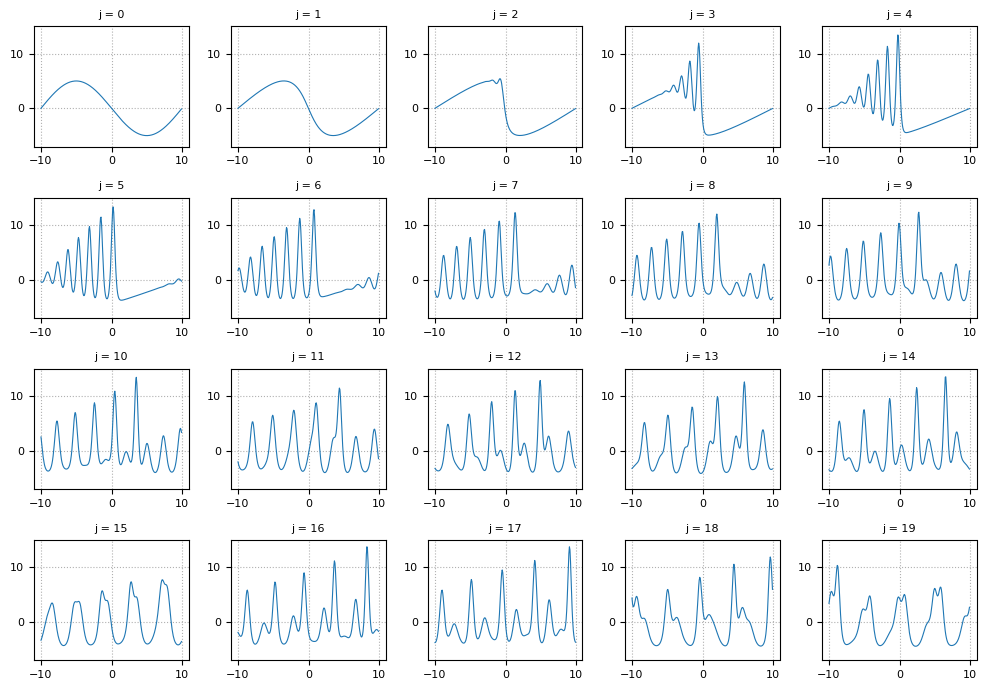

In [9]:
# FFT*v and FFT\v version

function update_KdV(o::FFT_Data, u, Δt, niters)
    v = o.FFT * u
    for iter in 1:niters
        v .= exp.(-Δt .* o.D3) .* v
        v .-= 3.0 .* Δt .* o.D .*(o.FFT * (o.FFT \ v).^2)
    end
    o.FFT \ v
end

function solve_KdV(o::FFT_Data{T}, f0, tmax) where T
    Δt = 1/o.N^2
    skip = floor(Int, 0.005/Δt)
    t = 0:skip*Δt:tmax
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = Complex.(f0.(o.x))
    for j in 2:M
        u[:,j] = update_KdV(o, @view(u[:,j-1]), Δt, skip)
    end
    return real(u), t
end

N = 2^8
K = 20/(2π)
o = FFT_Data(K, N);

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_KdV(o, f0, tmax)

sleep(0.1)
plot_KdV(o, u, t)

### FFTを in-place で利用した場合

  7.651844 seconds (855.68 k allocations: 46.709 MiB, 0.28% gc time)


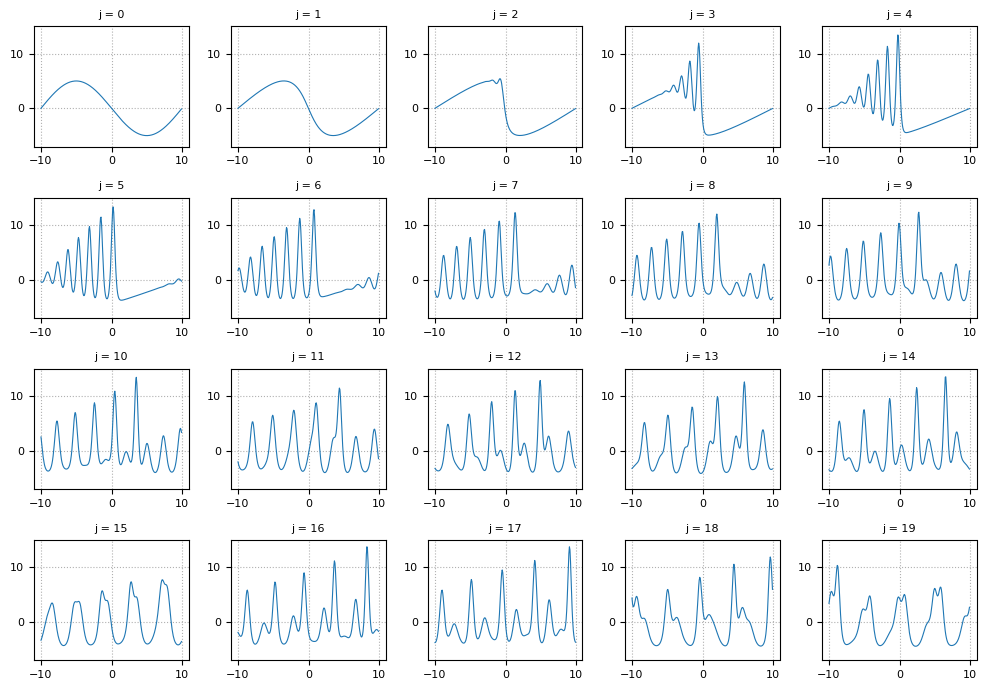

In [10]:
function update_KdV!(o::FFT_Data, u1, u0, Δt, niters)
    v = similar(u0)
    v_tmp = similar(u0)
    u_tmp = similar(u0)
    
    mul!(v, o.FFT, u0)
    for iter in 1:niters
        # v .= exp.(-Δt .* o.D3) .* v
        v .= exp.(-Δt .* o.D3) .* v
        
        # v .-= 3.0 .* Δt .* o.D .*(o.FFT * (o.FFT \ v).^2)
        ldiv!(u_tmp, o.FFT, v)
        u_tmp .*= u_tmp
        mul!(v_tmp, o.FFT, u_tmp)
        v .-= 3.0 .* Δt .* o.D .* v_tmp
    end
    ldiv!(u1, o.FFT, v)
end

function solve_KdV_inplace(o::FFT_Data{T}, f0, tmax) where T
    Δt = 1/o.N^2
    skip = floor(Int, 0.005/Δt)
    t = 0:skip*Δt:tmax
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = Complex.(f0.(o.x))
    for j in 2:M
        update_KdV!(o, @view(u[:,j]), @view(u[:,j-1]), Δt, skip)
    end
    return real(u), t
end

N = 2^8
K = 20/(2π)
o = FFT_Data(K, N);

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_KdV_inplace(o, f0, tmax)

sleep(0.1)
plot_KdV(o, u, t)

### KdV方程式: 初期条件 sin

以下のアニメーションはKdV方程式

$$
u_t = -u_{xxx} - 3(u^2)_x = -u_{xxx} -6uu_x
$$

を初期条件

$$
u(0,x) = -5\sin(πx/10)
$$

のもとで数値的に解いた結果である.  $\sin$ の初期条件からたくさんのソリトンが放出されている.  この結果は

* N.J. Zabusky and M. D. Kruskal, Phy. Rev. Lett., 15, 240 (1965)

による有名な仕事の再現になっている.


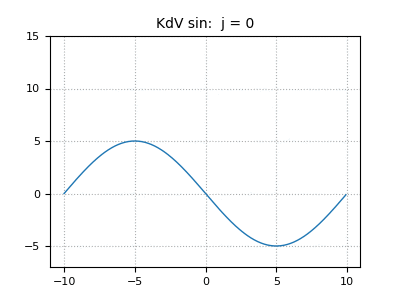

 24.879075 seconds (3.42 M allocations: 179.044 MiB, 0.29% gc time)


In [11]:
gifname = "KdV sin"
@time anim_KdV(gifname, o, u, t)

### ベンチマークテスト

In [12]:
using BenchmarkTools

N = 2^8
K = 20/(2π)
o = FFT_Data(K, N)

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.4

1.4

In [13]:
@benchmark u, t = solve_KdV(o, f0, tmax)

BenchmarkTools.Trial: 
  memory estimate:  1.10 GiB
  allocs estimate:  642611
  --------------
  minimum time:     11.372 s (2.22% GC)
  median time:      11.372 s (2.22% GC)
  mean time:        11.372 s (2.22% GC)
  maximum time:     11.372 s (2.22% GC)
  --------------
  samples:          1
  evals/sample:     1

In [14]:
@benchmark u, t = solve_KdV_inplace(o, f0, tmax)

BenchmarkTools.Trial: 
  memory estimate:  20.48 MiB
  allocs estimate:  276931
  --------------
  minimum time:     10.664 s (0.00% GC)
  median time:      10.664 s (0.00% GC)
  mean time:        10.664 s (0.00% GC)
  maximum time:     10.664 s (0.00% GC)
  --------------
  samples:          1
  evals/sample:     1

以上のように in-place 版は非 in-place 版よりも計算時間が1割程度短く, in-place版の消費メモリは非in-place版の50分の1である.

### KdV方程式: 2-soliton解

KdV方程式

$$
u_t = -u_{xxx} - 3(u^2)_x = -u_{xxx} -6uu_x
$$

の1ソリトン解は $c>0$ に対する

$$
u(t,x) = \frac{c}{2}\sech^2\frac{\sqrt{c}}{2}(x-ct-a)
$$

の形をしている.  ここで $\sech x = 1/\cosh x$, $\cosh x = (e^x-e^{-x})/2$ である.  $c>0$ が大きければ大きいほど, ソリトンは細くて高い山になり, 速く進む.

以下はKdV方程式を初期条件

$$
u(0,x) = f(16, -8, x) + f(4, -2, x)
$$

のもとで数値的に解いた結果である. ここで

$$
f(c, a, x) = \frac{c}{2}\sech^2\frac{\sqrt{c}}{2}(x-a).
$$

そのようにして得られたKdV方程式の数値解はKdV方程式の2ソリトン解とはぴったり一致しないが, 良い近似にはなっている.  KdV方程式は非線形偏微分方程式なので, 解は初期条件に線形に依存しない.

  7.480536 seconds (386.81 k allocations: 24.449 MiB, 1.11% gc time)


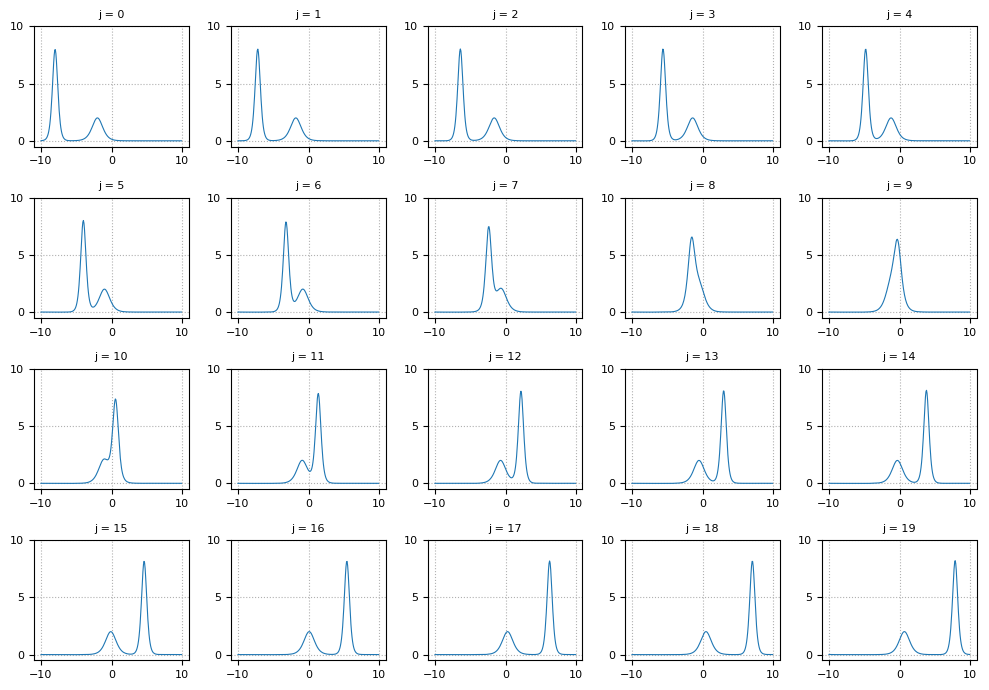

In [15]:
N = 2^8
K = 20/(2π)
o = FFT_Data(K, N);

KdVsoliton(c, a, x) = c/2*(sech(sqrt(c)/2*(x-a)))^2
f0(x) = KdVsoliton(16.0, -8.0, x) + KdVsoliton(4.0, -2.0, x)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_KdV_inplace(o, f0, tmax)

sleep(0.1)
plot_KdV(o, u, t, ymin=-0.5, ymax=10.0)


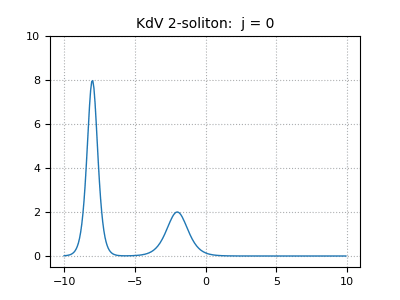

 23.427866 seconds (73.57 k allocations: 9.681 MiB, 0.04% gc time)


In [16]:
gifname = "KdV 2-soliton"
@time anim_KdV(gifname, o, u, t, ymin=-0.5, ymax=10.0)

速く進む高い山のソリトンと遅く進む低い山のソリトンがぶつかっても壊れずに, 2ソリトン状態が維持される. 各々のソリトンはまるで粒子のごとく壊れない.

## 空間1次元の時間依存のSchrödinger方程式

以下では次の形のSchrödinger方程式を扱う:

$$
i\frac{\d}{\d t}\psi = 
\left[-\frac{1}{2}\left(\frac{\d}{\d x}\right)^2 + V(x)\right]\psi.
$$

右辺の $[\;\;]$ の内側のoperatorをHamiltonianと呼ぶ.

この微分方程式に従う時間発展は $\varDelta t$ が微小なとき以下で近似される:

$$
\psi(t,x)\mapsto
\psi(t+\varDelta t,x) =
\exp(-i\varDelta t V(x))
\exp\left(\frac{i}{2}\varDelta t\left(\frac{\d}{\d x}\right)^2\right)
\psi(t,x).
$$

`o = FFT_Data(K, N)` のとき, `s = Schroedinger_Data(o, V)` はFFTに関するデータ `o` にポテンシャル函数 $V(x)$ のデータを合わせたものになる. `s.v` は離散化された $x$ 軸上での $V(x)$ の値になる.

In [17]:
# V はポテンシャル函数
#
mutable struct Schroedinger_Data{T, S, R}
    o::FFT_Data{T,S}
    V::R
    v::Array{T,1}
end

# FFT_Data o とポテンシャル函数 V から Schroedinger_Data を作成する函数
#
Schroedinger_Data(o, V) = Schroedinger_Data(o, V, V.(o.x))

function update_Schroedinger!(s::Schroedinger_Data, u1, u0, Δt, skip)
    o = s.o
    U_tmp = similar(u0)
    u1 .= u0

    for iter in 1:skip
        # exp.(-im .* Δt .* s.v) .* (o.FFT\(exp.(0.5im .* Δt .* o.D2).*(o.FFT * u)))
        mul!(U_tmp, o.FFT, u1)
        U_tmp .*= exp.(0.5im .* Δt .* o.D2)
        ldiv!(u1, o.FFT, U_tmp)
        u1 .*= exp.(-im .* Δt .* s.v)
    end
end

function solve_Schroedinger(s::Schroedinger_Data{T,S,R}, u0, tmax; Δt=2π/1000, skip=10) where {T,S,R}
    o = s.o
    t = 0:skip*Δt:tmax+10eps()
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = u0
    for j in 2:M
        update_Schroedinger!(s, @view(u[:,j]), @view(u[:,j-1]), Δt, skip)
    end
    return u, t
end

function plot_complexvalued(x, u, ymin, ymax)
    plot(o.x, real(u), lw=0.8)
    plot(o.x, imag(u), lw=0.8, ls="--")
    ylim(ymin, ymax)
    grid(ls=":")
    xticks(fontsize=8)
    yticks(fontsize=8)
end

function plot_Schroedinger(s::Schroedinger_Data, u, t; thin=10, ymin=-1.1, ymax=1.1)
    nplots = (length(t)-1)÷thin + 1
    o = s.o
    nrows = div(nplots+3, 5)

    figure(figsize=(4, 1.75))
    subplot(121)
    plot_complexvalued(o.x, u[:,1], ymin, ymax)
    title("initial state", fontsize=9)
    subplot(122)
    plot_u(o.x, s.v)
    title("potential", fontsize=9)
    tight_layout()

    
    figure(figsize=(10, 1.75nrows))
    for j in 1:nplots-1
        subplot(nrows, 5, j)
        plot_complexvalued(o.x, u[:,(j-1)*thin+2], ymin, ymax)
        title("j = $j", fontsize=9)
    end
    tight_layout()
end

function anim_Schroedinger(gifname, s::Schroedinger_Data, u, t; thin=2, interval=100, ymin=-1.1, ymax=1.1, giftitle=gifname)
    o = s.o
    function plotframe(j)
        clf()
        plot(o.x, real(u[:, (j-1)*thin+1]), lw=1.0)
        plot(o.x, imag(u[:, (j-1)*thin+1]), lw=1.0, ls="--")
        grid(ls=":")
        ylim(ymin, ymax)
        xticks(fontsize=8)
        yticks(fontsize=8)
        title("$(giftitle):  j = $(j-1)", fontsize=10)
        plot()
    end
    fig = figure(figsize=(4, 3))
    n = (length(t)-1)÷thin + 1
    frames = [1;1;1;1;1;1;1;1;1; 1:n; n;n;n;n;n;n;n;n;n;]
    ani=animation.FuncAnimation(fig, plotframe, frames=frames, interval=interval)
    ani.save("gifs/$(gifname).gif", writer="imagemagick")
    clf()
    displayfile("image/gif", "gifs/$(gifname).gif")
end

anim_Schroedinger (generic function with 1 method)

### Gaussian packet

`f = GaussianPacket(x₀, p₀, σ, Δx)` は函数

$$
f(x) =
\frac{1}{(\pi\sigma^2)^{1/4}}
\exp\left( \frac{ip_0(x-x_0)}{2} \right)
\exp\left(-\frac{(x-x₀)^2}{2\sigma^2}\right)
$$

になる. この函数の絶対値の2乗を $\R$ 上で積分すると $1$ になる.

我々は周期境界条件を扱っているので, 本当はこれを周期的に足し合わせて周期函数化してから使うべきなのだが, 面倒なのでそうしないことにする.

`(f::GaussianPacket)(x)` の形式でパラメーター `x₀`, `p₀`, `σ`, `Δx` を持つ函数を定義する方法については

* [Function-like objects](https://docs.julialang.org/en/v1/manual/methods/index.html#Function-like-objects-1) ([Julia 1.1 Documentation](https://docs.julialang.org/en/v1/))

などを参照せよ.

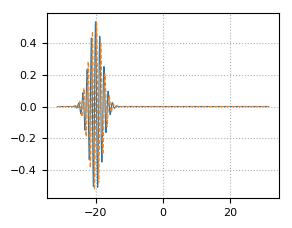

In [18]:
mutable struct GaussianPacket{T<:Real}
    x₀::T
    p₀::T
    σ::T
    Δx::T
end

function GaussianPacket(x₀, p₀, σ, o::FFT_Data)
    Δx = o.x[2] - o.x[1]
    GaussianPacket(x₀, p₀, σ, Δx)
end

function (f::GaussianPacket)(x)
    1/(π*f.σ^2)^(1/4) * exp(im*f.p₀*(x-f.x₀/2) - (x-f.x₀)^2/(2f.σ^2))
end

N = 2^10
K = 10
o = FFT_Data(K, N);

g0 = GaussianPacket(-20.0, 5.0, 2.0, o)
plot_u(o.x, g0.(o.x));

### 自由粒子

ポテンシャル函数がない場合の

$$
i\frac{\d}{\d t}\psi = -\frac{1}{2}\left(\frac{\d}{\d x}\right)^2 \psi
$$

をGaussian packetの初期値で数値的に解いてみる.  Gaussian packetが広がりながら波が進んで行く.

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.765858 seconds (1.40 M allocations: 74.365 MiB, 4.45% gc time)


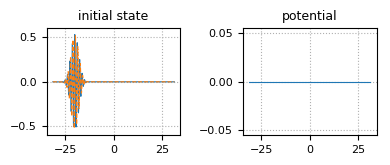

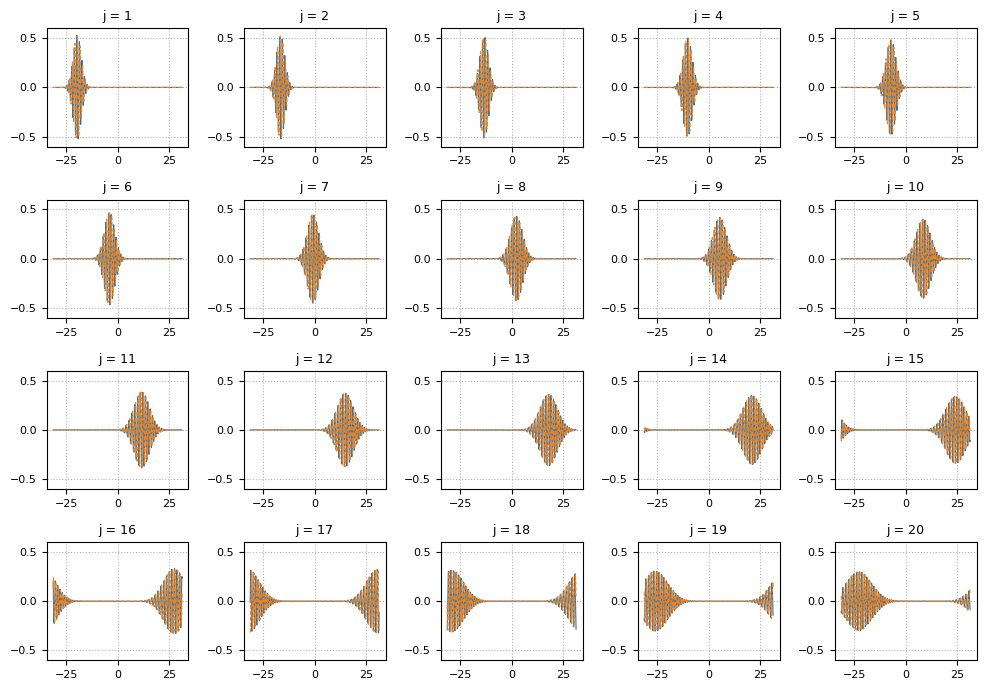

In [19]:
# 自由粒子

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = 0.0
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 5.0, 2.0, o)
u0 = g0.(o.x)

T = 2.0
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.6, ymax=0.6)


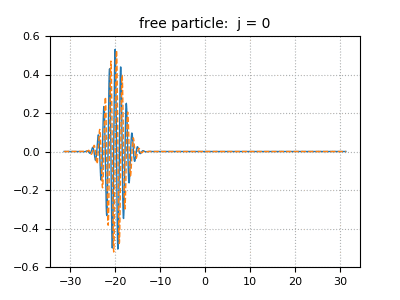

 25.518765 seconds (363.80 k allocations: 35.939 MiB, 0.03% gc time)


In [20]:
gifname = "free particle"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.6, ymax=0.6)

### 低い壁

ポテンシャル函数が壁の形をした

$$
V(x) = \begin{cases}
10 & (0\leqq x\leqq 10) \\
0 & (\text{otherwise}) \\
\end{cases}
$$

の場合の

$$
i\frac{\d}{\d t}\psi = \left[-\frac{1}{2}\left(\frac{\d}{\d x}\right)^2 + V(x)\right]\psi
$$

を数値的に解いてみる.

低い壁に衝突した Gaussian packet の半分程度が壁を透過し, 残りの半分程度が壁を反射している.

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.245740 seconds (5.02 k allocations: 5.007 MiB)


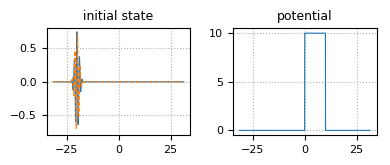

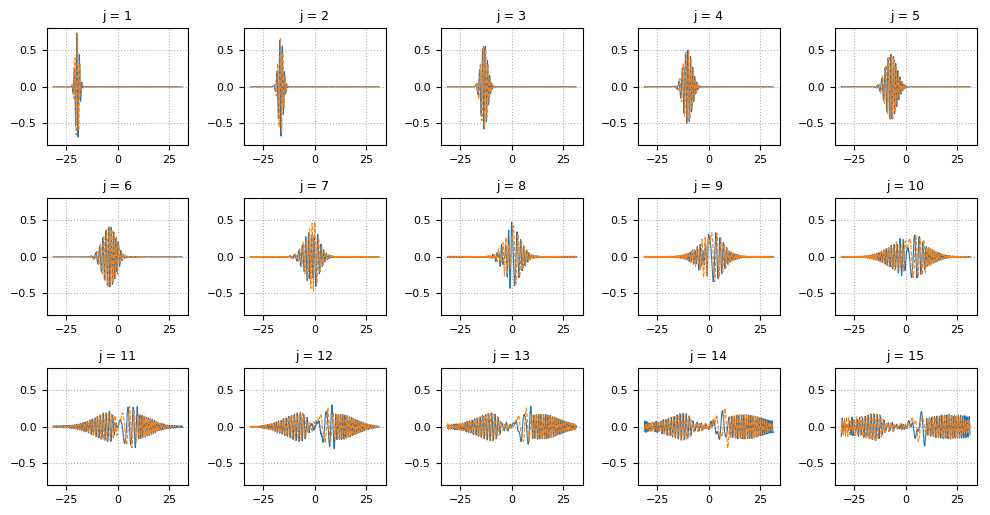

In [21]:
# 壁=(高さ10、幅10)、粒子=運動量5)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = ifelse(0 ≤ x ≤ 10, 10.0, 0.0)
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 5.0, 1.0, o)
u0 = g0.(o.x)

T = 1.5
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.8, ymax=0.8)


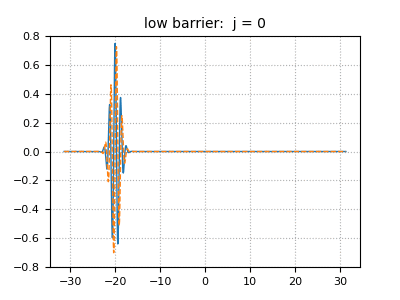

 21.086163 seconds (65.86 k allocations: 14.668 MiB, 0.04% gc time)


In [22]:
gifname = "low barrier"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.8, ymax=0.8)

### 高い壁

ポテンシャル函数が壁の形をした

$$
V(x) = \begin{cases}
20 & (0\leqq x\leqq 10) \\
0 & (\text{otherwise}) \\
\end{cases}
$$

の場合の

$$
i\frac{\d}{\d t}\psi = \left[-\frac{1}{2}\left(\frac{\d}{\d x}\right)^2 + V(x)\right]\psi
$$

を数値的に解いてみる.  壁の高さは上の場合の2倍になっている.

高い壁に衝突した Gaussian packet の大部分が壁を反射している.

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.254651 seconds (5.02 k allocations: 5.007 MiB)


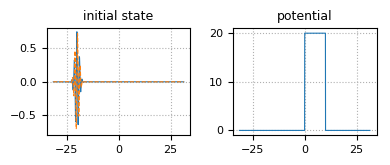

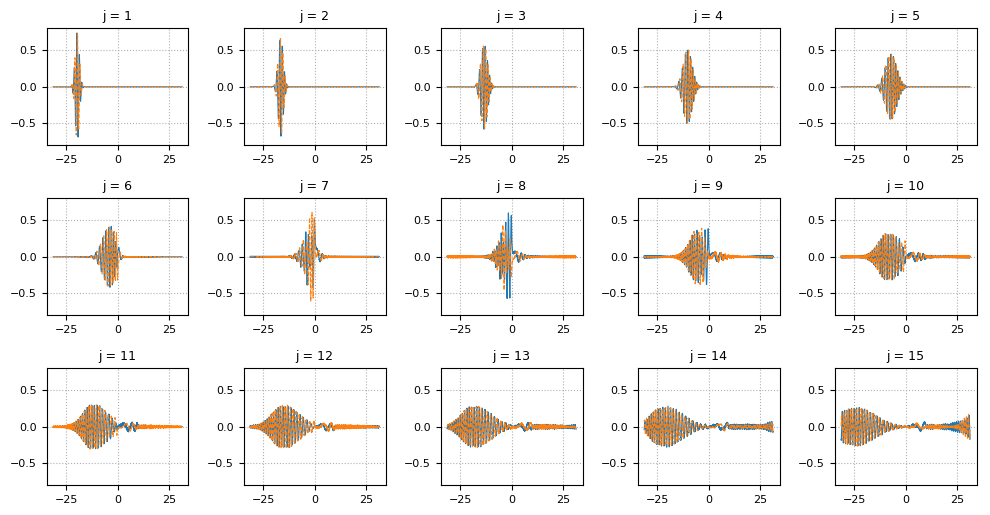

In [23]:
# 壁=(高さ20、幅10)、粒子=運動量5)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = ifelse(0 ≤ x ≤ 10, 20.0, 0.0)
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 5.0, 1.0, o)
u0 = g0.(o.x)

T = 1.5
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.8, ymax=0.8)


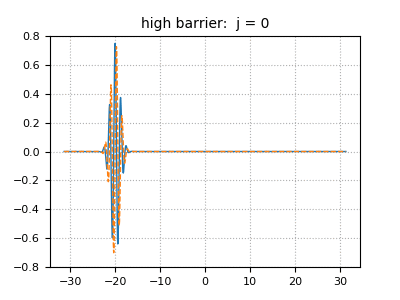

 19.733394 seconds (65.27 k allocations: 14.494 MiB, 0.03% gc time)


In [24]:
gifname = "high barrier"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.8, ymax=0.8)

### 調和振動子

時間に依存する量子調和振動子の方程式

$$
i\frac{\d}{\d t}\psi = \left[-\frac{1}{2}\left(\frac{\d}{\d x}\right)^2 + \frac{1}{2}x^2\right]\psi
$$

を数値的に解いてみる.  Gaussian packet が壊れずに左右に振動する.

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.442637 seconds (6.68 k allocations: 6.664 MiB, 1.13% gc time)


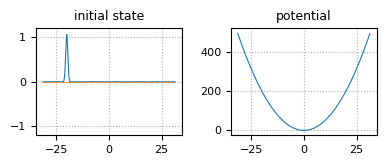

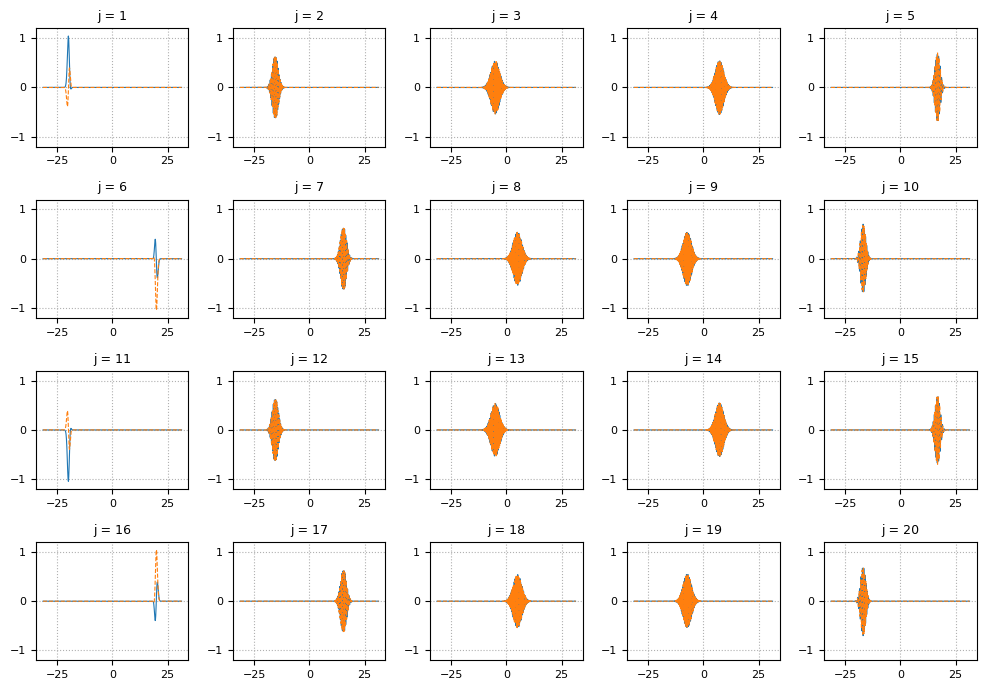

In [25]:
# 調和振動子 (周期 2π)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = x^2/2
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 0.0, 0.5, o)
u0 = g0.(o.x)

T = 2.0
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-1.2, ymax=1.2)


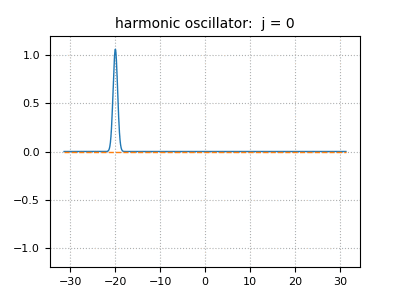

 44.440576 seconds (154.40 k allocations: 30.416 MiB, 0.02% gc time)


In [26]:
gifname = "harmonic oscillator"
@time anim_Schroedinger(gifname, s, u, t, ymin=-1.2, ymax=1.2, thin=1)

### $V(x) = -100 \exp(-x^2/100)$

ポテンシャルが

$$
V(x) = -100 \exp(-x^2/100)
$$

の場合の

$$
i\frac{\d}{\d t}\psi = \left[-\frac{1}{2}\left(\frac{\d}{\d x}\right)^2 + V(x)\right]\psi
$$


を数値的に解いてみる.

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.731823 seconds (110.36 k allocations: 12.037 MiB, 0.78% gc time)


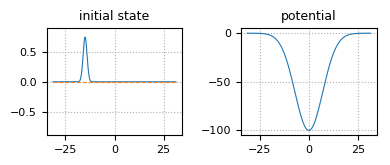

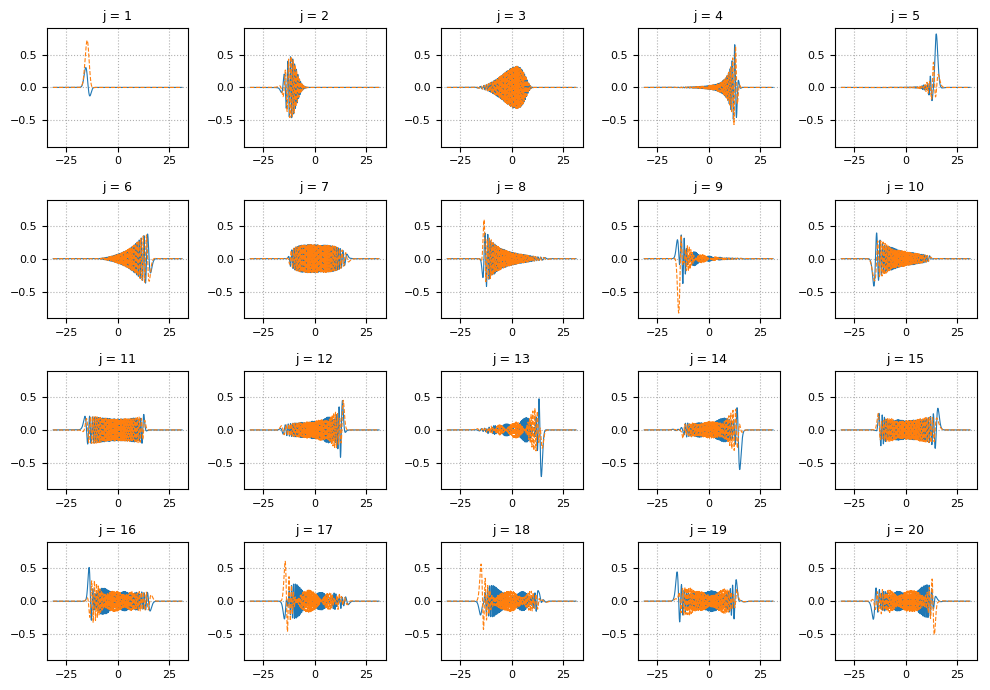

In [27]:
# V(x) = -20 exp(-x^2/25)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = -100 * exp(-x^2/100)
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-15.0, 0.0, 1.0, o)
u0 = g0.(o.x)

T = 4.0
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax, skip=20)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.9, ymax=0.9)


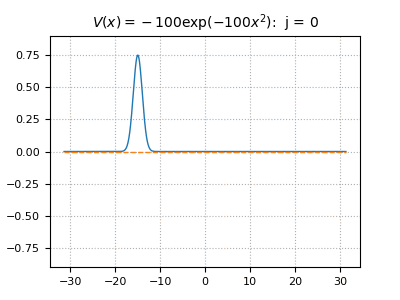

 25.842278 seconds (96.53 k allocations: 21.881 MiB, 0.02% gc time)


In [28]:
gifname = "V(x)=-100exp(-x2／100)"
giftitle = "\$V(x)=-100\\exp(-100x^2)\$"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.9, ymax=0.9, giftitle=giftitle)

## Smith方程式

KdV equation

$$
u_t = -\partial_x^3 u - 3\partial_x(u^2).
$$

に似ている

Smith's equation

$$
u_t = 2a^{-2}\left( \sqrt{1-a^2\partial_x^2} - 1 \right)\partial_x u - 3\partial_x(u^2).
$$

を数値的に解いてみる. 以下では $a^2=0.15$ と仮定する.

In [29]:
function plot_Smith(o::FFT_Data, u, t; thin=10, ymin=-7.0, ymax=25.0)
    nplots = div(length(t), thin)
    nrows = div(nplots+4, 5)

    figure(figsize=(10, 1.75nrows))
    
    j = 0
    plot_u(o, @view(u[:,j+1]), nrows, j, ymin, ymax)

    for j in 1:nplots-1
        plot_u(o, @view(u[:,thin*j+1]), nrows, j, ymin, ymax)
    end
 
    tight_layout()
end

function anim_Smith(gifname, o::FFT_Data, u, t; thin=2, interval=100, ymin=-7.0, ymax=25.0)
    function plotframe(j)
        clf()
        plot(o.x, real(u[:, (j-1)*thin + 1]), lw=1.0)
        grid(ls=":")
        ylim(ymin, ymax)
        xticks(fontsize=8)
        yticks(fontsize=8)
        title("$(gifname):  j = $(j-1)", fontsize=10)
        plot()
    end
    fig = figure(figsize=(4, 3))
    n = (length(t)-1)÷thin + 1
    frames = [1;1;1;1;1;1;1;1;1; 1:n; n;n;n;n;n;n;n;n;n;]
    ani=animation.FuncAnimation(fig, plotframe, frames=frames, interval=interval)
    ani.save("gifs/$(gifname).gif", writer="imagemagick")
    clf()
    displayfile("image/gif", "gifs/$(gifname).gif")
end

anim_Smith (generic function with 1 method)

In [30]:
function update_Smith!(o::FFT_Data, u1, u0, Δt, niters, a²)
    v = similar(u0)
    v_tmp = similar(u0)
    u_tmp = similar(u0)
    
    mul!(v, o.FFT, u0)
    for iter in 1:niters
        v .= exp.(2 ./ a² .* Δt .* (sqrt.(1 .- a² .* o.D2) .- 1).*o.D) .* v
        
        # v .-= 3.0 .* Δt .* o.D .*(o.FFT * (o.FFT \ v).^2)
        ldiv!(u_tmp, o.FFT, v)
        u_tmp .*= u_tmp
        mul!(v_tmp, o.FFT, u_tmp)
        v .-= 3.0 .* Δt .* o.D .* v_tmp
    end
    ldiv!(u1, o.FFT, v)
end

function solve_Smith_inplace(o::FFT_Data{T}, f0, tmax; a²=0.15) where T
    Δt = 1/o.N^2
    skip = floor(Int, 0.005/Δt)
    t = 0:skip*Δt:tmax
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = Complex.(f0.(o.x))
    for j in 2:M
        update_Smith!(o, @view(u[:,j]), @view(u[:,j-1]), Δt, skip, a²)
    end
    return real(u), t
end

solve_Smith_inplace (generic function with 1 method)

### Smith方程式: 初期条件 sin

 36.461740 seconds (2.13 M allocations: 115.923 MiB, 0.09% gc time)


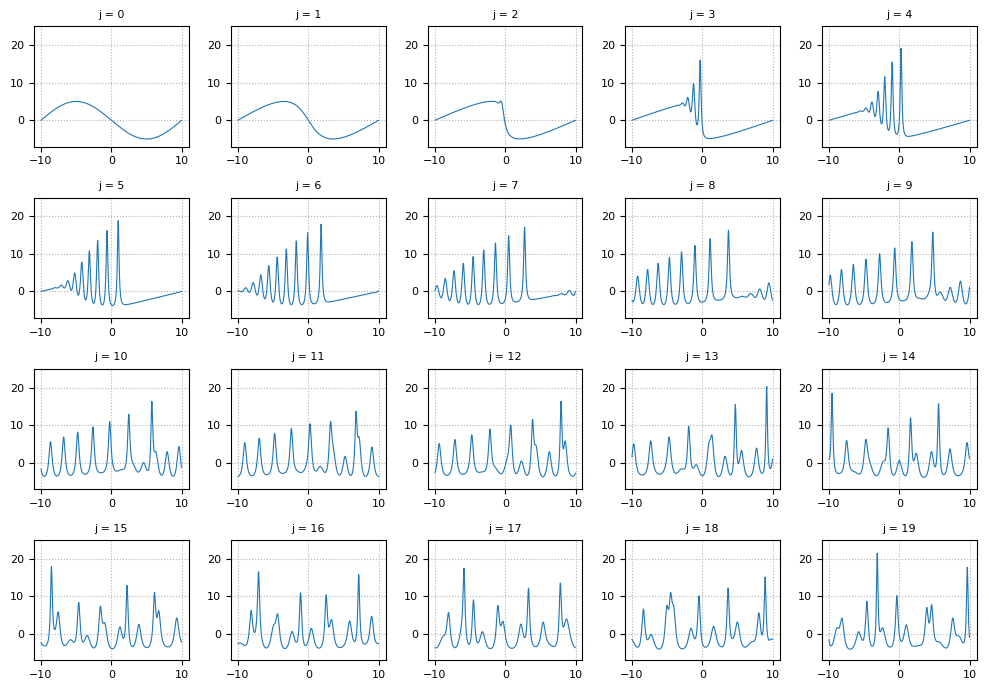

In [31]:
N = 2^9
K = 20/(2π)
o = FFT_Data(K, N);

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_Smith_inplace(o, f0, tmax)

sleep(0.1)
plot_Smith(o, u, t, thin=10)


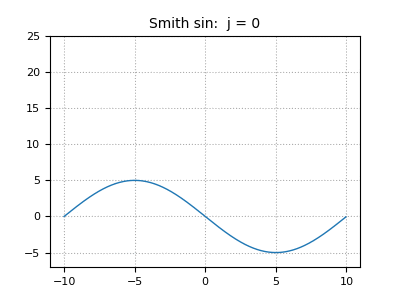

 23.008041 seconds (314.49 k allocations: 22.933 MiB, 0.03% gc time)


In [32]:
gifname = "Smith sin"
@time anim_Smith(gifname, o, u, t)

### Smith方程式: 初期条件 KdV 2-soliton

 36.150694 seconds (912.03 k allocations: 57.313 MiB, 0.02% gc time)


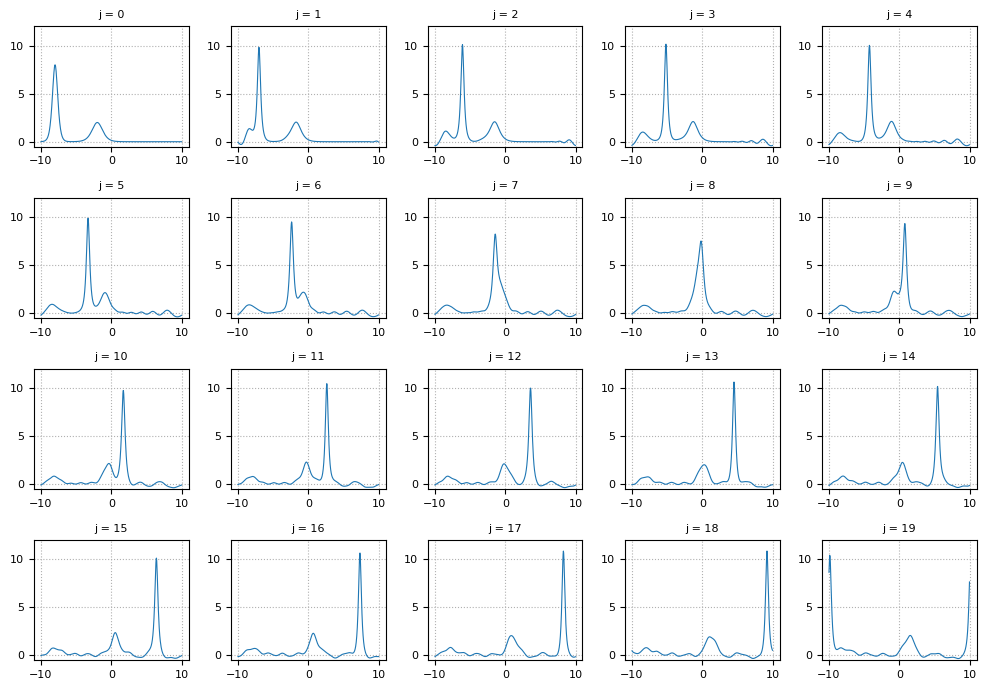

In [33]:
N = 2^9
K = 20/(2π)
o = FFT_Data(K, N);

KdVsoliton(c, a, x) = c/2*(sech(sqrt(c)/2*(x-a)))^2
f0(x) = KdVsoliton(16.0, -8.0, x) + KdVsoliton(4.0, -2.0, x)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_Smith_inplace(o, f0, tmax)

sleep(0.1)
plot_Smith(o, u, t, ymin=-0.5, ymax=12.0)


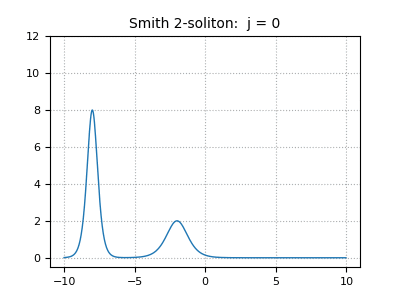

 22.813658 seconds (73.58 k allocations: 10.087 MiB, 0.02% gc time)


In [34]:
gifname = "Smith 2-soliton"
@time anim_Smith(gifname, o, u, t, ymin=-0.5, ymax=12.0)